In [1]:
import os 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statistics as st
from sklearn import tree
import warnings
warnings.filterwarnings('ignore')

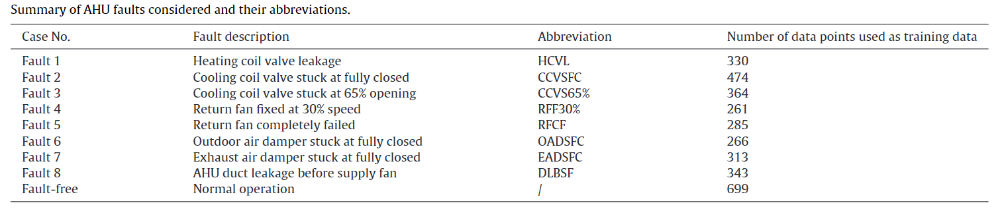

In [2]:
labels = ['NORMAL','EADSFC','RFF30%','RFCF','OADSFC','CCVSFC','HCVL','CCVS65%','DLBSF']

In [3]:
import glob
path = r'E:\Prasad\IITM\summer ASHRAE 1312 data\Decision tree paper data summer'

filenames = glob.glob(path + "\*.xls")

In [4]:
df= pd.DataFrame()
#Merge all data files in df dataframe
for f in filenames:
    data = pd.read_excel(f, 'A')              
    df = pd.concat([df,data]) 

In [5]:
dataframe_collection = {}

In [6]:
#Take data from 6:20(startup period ignored) am to 6 pm for each day(occupied period). In unoccupied period,sensor readings not changes substantially
for i in range(len(filenames)):
    dataframe_collection[i] = df.iloc[381+1440*i:1081+1440*i,:]

In [7]:
#Check mising values, and if there are NaN values, it will replaced by interpolating values (Missing data in 22/08/2007  )
for i in range(len(filenames)):
    if dataframe_collection[i].isnull().sum().sum() != 0:   #check total no of NaN values
        dataframe_collection[i] = dataframe_collection[i].interpolate(method ='linear', limit_direction ='forward') 
#%store dataframe_collection

#Add target variable for multiclass classifier
b = [0,1,2,3,0,4,5,6,7,0,8]
for i in range(len(filenames)):
    dataframe_collection[i].loc[:,'y']= b[i]   

In [8]:
# Sample the data. 40-60% from each fault and all datapoints from normal data
Data = pd.DataFrame()
# 27/08/2007 cooling coil fully closed - data can't be used as all readings CHWC-VLV are 0.
# 26/08/2007 approx for starting 1 hour SA-SP sensor data is zero. (upto 454)
# 2/9/2007 HWC-VLV 0 signal

#dataframe_collection[8]['HWC-VLV'].iloc[0:200] = 1
#dataframe_collection[5]['SA-SP'].iloc[0:74] = dataframe_collection[0]['SA-SP'].iloc[0:74].values
#dataframe_collection[6]['CHWC-VLV'] = 1
for i in range(len(filenames)):
    Data = pd.concat([Data, dataframe_collection[i]] )  
    
Data    


        

,DATE,TIME,SYS-CTL,RF-CTRL,ECONCTRL,ACCH-SEL,HWC-VLV,CHWC-VLV,EA-DMPR,RA-DMPR,...,E_hcoil,E_ccoil,E_SF,E_RF,E_ZONE_I,E_ZONE_W,E_ZONE_S,E_ZONE_E,OA-TEMP.1,y
381,8192007,621,1,1,1,1,100.0,45.368,40.0,40.0,...,0.0,15.952,0.902,0.273,-0.012,0.000,0.001,0.0,75.600,0
382,8192007,622,1,1,1,1,100.0,43.524,40.0,40.0,...,0.0,15.857,0.887,0.269,-0.011,0.000,0.001,0.0,75.639,0
383,8192007,623,1,1,1,1,100.0,40.313,40.0,40.0,...,0.0,15.695,0.889,0.261,-0.012,0.001,0.001,0.0,75.639,0
384,8192007,624,1,1,1,1,100.0,37.698,40.0,40.0,...,0.0,14.828,0.855,0.257,-0.012,0.000,0.001,0.0,75.664,0
385,8192007,625,1,1,1,1,100.0,34.503,40.0,40.0,...,0.0,13.648,0.727,0.246,-0.011,0.000,0.000,0.0,75.664,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1076,9082007,1756,1,1,1,1,100.0,38.452,40.0,40.0,...,0.0,15.337,1.486,0.286,-0.003,0.000,-0.001,0.0,79.391,8
1077,9082007,1757,1,1,1,1,100.0,38.050,40.0,40.0,...,0.0,15.259,1.493,0.292,-0.002,0.000,-0.001,0.0,79.482,8
1078,9082007,1758,1,1,1,1,100.0,38.074,40.0,40.0,...,0.0,15.298,1.486,0.295,-0.003,0.000,-0.001,0.0,79.760,8
1079,9082007,1759,1,1,1,1,100.0,37.873,40.0,40.0,...,0.0,15.479,1.507,0.294,-0.003,0.000,-0.001,0.0,79.858,8


In [9]:
train_data1 = dataframe_collection[9].iloc[460:700]

In [10]:
from SSD import *
steady_st_data = SSD(train_data1,Data)

,index,DATE,TIME,SYS-CTL,RF-CTRL,ECONCTRL,ACCH-SEL,HWC-VLV,CHWC-VLV,EA-DMPR,...,E_hcoil,E_ccoil,E_SF,E_RF,E_ZONE_I,E_ZONE_W,E_ZONE_S,E_ZONE_E,OA-TEMP.1,y
0,540,8192007.0,900.0,1.0,1.0,1.0,1.0,100.0,37.524,40.0,...,0.0,13.614,0.900,0.261,-0.006,0.0,0.000,0.0,77.725,0.0
1,541,8192007.0,901.0,1.0,1.0,1.0,1.0,100.0,37.608,40.0,...,0.0,13.686,0.876,0.262,-0.005,0.0,0.000,0.0,77.751,0.0
2,553,8192007.0,913.0,1.0,1.0,1.0,1.0,100.0,38.173,40.0,...,0.0,14.037,0.967,0.285,-0.005,0.0,0.000,0.0,78.030,0.0
3,554,8192007.0,914.0,1.0,1.0,1.0,1.0,100.0,38.509,40.0,...,0.0,14.045,0.953,0.279,-0.006,0.0,0.000,0.0,78.056,0.0
4,555,8192007.0,915.0,1.0,1.0,1.0,1.0,100.0,38.585,40.0,...,0.0,14.063,0.977,0.271,-0.005,0.0,0.000,0.0,78.127,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2755,1065,9082007.0,1745.0,1.0,1.0,1.0,1.0,100.0,40.501,40.0,...,0.0,15.535,1.469,0.290,-0.003,0.0,-0.001,0.0,79.151,8.0
2756,1077,9082007.0,1757.0,1.0,1.0,1.0,1.0,100.0,38.050,40.0,...,0.0,15.259,1.493,0.292,-0.002,0.0,-0.001,0.0,79.482,8.0
2757,1078,9082007.0,1758.0,1.0,1.0,1.0,1.0,100.0,38.074,40.0,...,0.0,15.298,1.486,0.295,-0.003,0.0,-0.001,0.0,79.760,8.0
2758,1079,9082007.0,1759.0,1.0,1.0,1.0,1.0,100.0,37.873,40.0,...,0.0,15.479,1.507,0.294,-0.003,0.0,-0.001,0.0,79.858,8.0


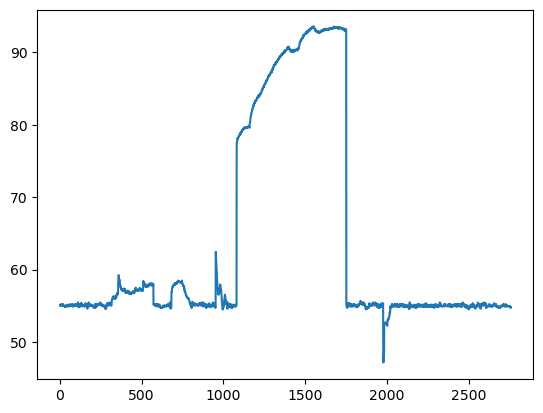

In [11]:
steady_st_data = steady_st_data.reset_index()
plt.plot(steady_st_data['SA-TEMP'])
steady_st_data

In [12]:
[st, ky] = threshold_SSD(train_data1)

In [13]:
st

0.052426029114249525

In [14]:
Data

,DATE,TIME,SYS-CTL,RF-CTRL,ECONCTRL,ACCH-SEL,HWC-VLV,CHWC-VLV,EA-DMPR,RA-DMPR,...,E_hcoil,E_ccoil,E_SF,E_RF,E_ZONE_I,E_ZONE_W,E_ZONE_S,E_ZONE_E,OA-TEMP.1,y
381,8192007,621,1,1,1,1,100.0,45.368,40.0,40.0,...,0.0,15.952,0.902,0.273,-0.012,0.000,0.001,0.0,75.600,0
382,8192007,622,1,1,1,1,100.0,43.524,40.0,40.0,...,0.0,15.857,0.887,0.269,-0.011,0.000,0.001,0.0,75.639,0
383,8192007,623,1,1,1,1,100.0,40.313,40.0,40.0,...,0.0,15.695,0.889,0.261,-0.012,0.001,0.001,0.0,75.639,0
384,8192007,624,1,1,1,1,100.0,37.698,40.0,40.0,...,0.0,14.828,0.855,0.257,-0.012,0.000,0.001,0.0,75.664,0
385,8192007,625,1,1,1,1,100.0,34.503,40.0,40.0,...,0.0,13.648,0.727,0.246,-0.011,0.000,0.000,0.0,75.664,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1076,9082007,1756,1,1,1,1,100.0,38.452,40.0,40.0,...,0.0,15.337,1.486,0.286,-0.003,0.000,-0.001,0.0,79.391,8
1077,9082007,1757,1,1,1,1,100.0,38.050,40.0,40.0,...,0.0,15.259,1.493,0.292,-0.002,0.000,-0.001,0.0,79.482,8
1078,9082007,1758,1,1,1,1,100.0,38.074,40.0,40.0,...,0.0,15.298,1.486,0.295,-0.003,0.000,-0.001,0.0,79.760,8
1079,9082007,1759,1,1,1,1,100.0,37.873,40.0,40.0,...,0.0,15.479,1.507,0.294,-0.003,0.000,-0.001,0.0,79.858,8


In [15]:
input_var = ['SA-TEMP','RES_SFSPD','RF-WAT','OA-TEMP.1','MA-TEMP','CHWC-VLV']
input_var1 = ['SA-TEMP','SF-SPD','RF-WAT','SF-WAT','RF-SPD','SA-CFM','OA-TEMP.1','MA-TEMP','CHWC-VLV']

In [16]:

#Drop unnecessay column variables
steady_st_data = steady_st_data.drop(['index','DATE','TIME'], axis=1)

In [17]:
# fault free data for regression model
df_normal = pd.DataFrame()
df_normal = pd.concat([dataframe_collection[0],dataframe_collection[4],dataframe_collection[9]])
df_normal = df_normal.sample(n=1440)

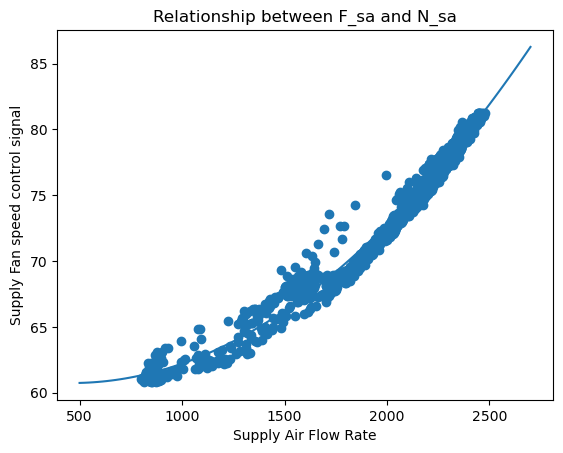

In [18]:
# F_sa is supply air flow rate and N_sf is supply fan speed control signal
F_sa = df_normal['SA-CFM']
N_sf = df_normal['SF-SPD']

mymodel = np.poly1d(np.polyfit(F_sa, N_sf, 2))

myline = np.linspace(500, 2700, 100)

plt.scatter(F_sa, N_sf)
plt.plot(myline, mymodel(myline))
# Add labels to your graph
plt.xlabel('Supply Air Flow Rate')
plt.ylabel('Supply Fan speed control signal')
plt.title("Relationship between F_sa and N_sa")
plt.show()

In [19]:
mymodel

poly1d([ 5.09765856e-06, -4.71301703e-03,  6.18300828e+01])

In [20]:
residual = pd.DataFrame()
residual = mymodel[0] + mymodel[1]*steady_st_data['SA-CFM'] + mymodel[2]*steady_st_data['SA-CFM']*steady_st_data['SA-CFM'] - steady_st_data['SF-SPD']

In [21]:
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

In [22]:
X=steady_st_data[input_var1].copy()# Features
Y=steady_st_data['y'].copy()  #label

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3333) # 2/3 rd training and 1/3 rd testing data

In [23]:
# Residual feature add in Dataset
steady_st_datar = steady_st_data
steady_st_datar['RES_SFSPD'] = residual

y = steady_st_datar['y']
RES_SFSPD = steady_st_datar['RES_SFSPD']
steady_st_datar = steady_st_datar.drop(['y','RES_SFSPD'], axis=1)
steady_st_datar['RES_SFSPD'] = RES_SFSPD
Data1 = steady_st_datar
steady_st_datar['y'] = y

Xr=steady_st_datar[input_var]# Features
Yr=steady_st_datar['y']  #label

# Split dataset into training set and test set
X_trainr, X_testr, y_trainr, y_testr = train_test_split(Xr, Yr, test_size=0.3333) # 2/3 rd training and 1/3 rd testing data

In [24]:
# Function to perform training with giniIndex.
def train_using_gini(X_train, X_test, y_train):
  
    # Creating the classifier object
    clf_gini = DecisionTreeClassifier(max_depth=7)
  
    # Performing training
    clf_gini.fit(X_train, y_train)
    return clf_gini

# Function to make predictions
def prediction(X_test, clf_object):
  
    # Predicton on test with giniIndex
    y_pred = clf_object.predict(X_test)
    return y_pred
      
# Function to calculate accuracy
def cal_accuracy(y_test, y_pred):
      
    print("\nConfusion Matrix: \n",
        confusion_matrix(y_test, y_pred))
      
    print ("\nAccuracy : \n",
    accuracy_score(y_test,y_pred)*100)
      
    print("\nReport :\n ",
    classification_report(y_test, y_pred))
    

def visualize_tree(clf_gini, X_train):
     #Visualize the decision tree
    from sklearn.tree import export_graphviz
    # Export as dot file
    export_graphviz(clf_gini, 
                out_file='tree.dot', 
                feature_names = X_train.columns,
                class_names = labels,
                rounded = True, proportion = False, 
                precision = 2, filled = True)
    # Convert to png using system command (requires Graphviz)
    from subprocess import call
    call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])


     # Display in jupyter notebook
    from IPython.display import Image
    display(Image(filename = 'tree.png'))
    
def confusion_matrix(y_test, y_pred):  
    #Import confusion matrix to visualize results
    from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

    conf_mat = confusion_matrix(y_test, y_pred, normalize = 'true')
    #Reset figure size
    plt.rcParams["figure.figsize"] = (9, 7)
    #Create the Confusion Matrix Display Object(cmd_obj). Note the 
    #alphabetical/numric sorting order of the labels.
    cmd_obj = ConfusionMatrixDisplay(conf_mat, display_labels=labels)
    # The plot() function has to be called for the sklearn visualization
    #code to do its work and the Axes object to be created.
    cmd_obj.plot()
    # Use the Axes attribute 'ax_' to get to the underlying Axes object.
    #The Axes object controls the labels for the X and the Y axes. It
    #also controls the title.
    cmd_obj.ax_.set(
                title='Normalized Confusion Matrix', 
                xlabel='Predicted Label', 
                ylabel='True Label')
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 90-degrees
    #Finally, call the matplotlib show() function to display the visualization
    #of the Confusion Matrix.
    plt.show()    

In [25]:
def pruning(X_train, y_train, X_test, y_test):
    
    clf = DecisionTreeClassifier(random_state=0)
    path = clf.cost_complexity_pruning_path(X_train, y_train)
    ccp_alphas, impurities = path.ccp_alphas, path.impurities

    fig, ax = plt.subplots()
    ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o")
    ax.set_xlabel("effective alpha")
    ax.set_ylabel("total impurity of leaves")
    ax.set_title("Total Impurity vs effective alpha for training set")
    ax.invert_xaxis()  
    plt.legend()
    plt.show()
    
    clfs = []
    for ccp_alpha in ccp_alphas:
        clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
        clf.fit(X_train, y_train)
        clfs.append(clf)
    print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(clfs[-1].tree_.node_count, ccp_alphas[-1]))  
    
    clfs = clfs[:-1]
    ccp_alphas = ccp_alphas[:-1]
    node_counts = [clf.tree_.node_count for clf in clfs]
 
    
    depth = [clf.tree_.max_depth for clf in clfs]
    plt.scatter(ccp_alphas,node_counts)
    plt.scatter(ccp_alphas,depth)
    plt.plot(ccp_alphas,node_counts,label='no of nodes',drawstyle="steps-post")
    plt.plot(ccp_alphas,depth,label='depth',drawstyle="steps-post")
    plt.legend()
    plt.show()
    
    train_acc = []
    test_acc = []
    rel_err = []
    for c in clfs:
        y_train_pred = c.predict(X_train)
        y_test_pred = c.predict(X_test)
        train_acc.append(accuracy_score(y_train_pred,y_train))
        rel_err.append(1-accuracy_score(y_train_pred,y_train))
        test_acc.append(accuracy_score(y_test_pred,y_test))

    plt.scatter(ccp_alphas,train_acc)
    plt.scatter(ccp_alphas,test_acc)
    plt.plot(ccp_alphas,train_acc,label='train_accuracy',drawstyle="steps-post")
    plt.plot(ccp_alphas,test_acc,label='test_accuracy',drawstyle="steps-post")
    plt.legend()
    plt.title('Accuracy vs alpha')
    plt.show()
    
    rel_err =  [a/0.58 for a in rel_err]
    fig2, ax2 = plt.subplots()
    ax2.scatter(ccp_alphas, rel_err)
    ax2.plot(ccp_alphas,rel_err,label='Realative Error')
    ax2.set_xlabel("Complexity parameter")
    ax2.set_ylabel("Relative error")
    ax2.set_title('Relative Error vs alpha')
   # plt.xlim(max(ccp_alphas), min(ccp_alphas))
    ax2.invert_xaxis()
    plt.legend()
    plt.show()
    
    clf_ = tree.DecisionTreeClassifier(random_state=0,ccp_alpha=0.0021)
    clf_.fit(X_train,y_train)
    y_train_pred_ = clf_.predict(X_train)
    y_test_pred_ = clf_.predict(X_test)

    print(f'Train score {accuracy_score(y_train_pred_,y_train)}')
    print(f'Test score {accuracy_score(y_test_pred_,y_test)}')
    confusion_matrix(y_train_pred_,y_train)
    #confusion_matrix(y_test_pred_,y_test)
    visualize_tree(clf_, X_train)
    cal_accuracy(y_test, y_test_pred_)
    return ccp_alphas


Results Using Gini Index(Without residual feature):


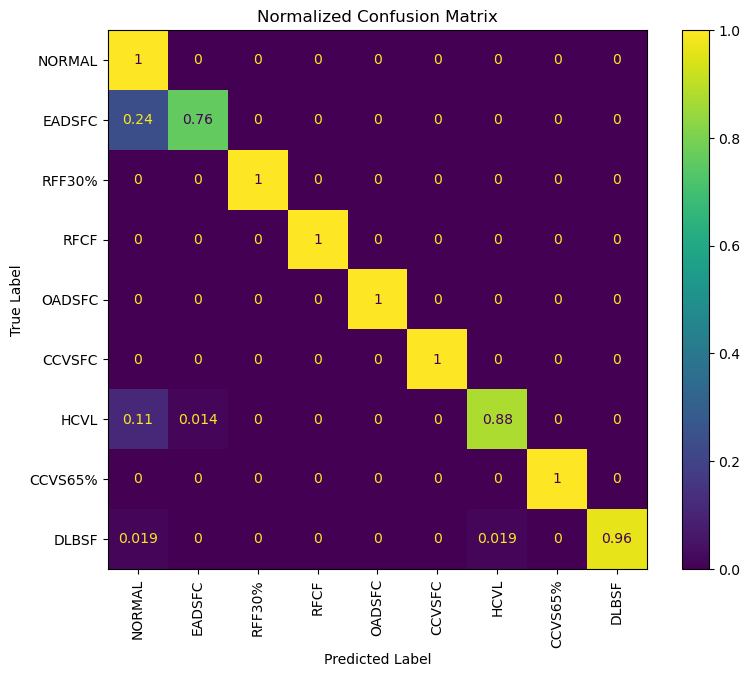


Confusion Matrix: 
 None

Accuracy : 
 97.5

Report :
                precision    recall  f1-score   support

         0.0       0.90      1.00      0.95       199
         1.0       0.97      0.76      0.85        50
         2.0       1.00      1.00      1.00       106
         3.0       1.00      1.00      1.00        53
         4.0       1.00      1.00      1.00        29
         5.0       1.00      1.00      1.00       244
         6.0       0.98      0.88      0.93        73
         7.0       1.00      1.00      1.00       113
         8.0       1.00      0.96      0.98        53

    accuracy                           0.97       920
   macro avg       0.98      0.96      0.97       920
weighted avg       0.98      0.97      0.97       920



In [26]:
# Driver code
def main():
      
    # Without residual feature
    clf = train_using_gini(X_train, X_test, y_train)
    # Operational Phase
    print("\nResults Using Gini Index(Without residual feature):")
      
    # Prediction using gini
    y_pred = prediction(X_test, clf)
    cal_accuracy(y_test, y_pred)
 
    
    visualize_tree(clf, X_train)
    
    
#Calling main function
if __name__=="__main__":
    main()


Results Using Gini Index(With residual feature):


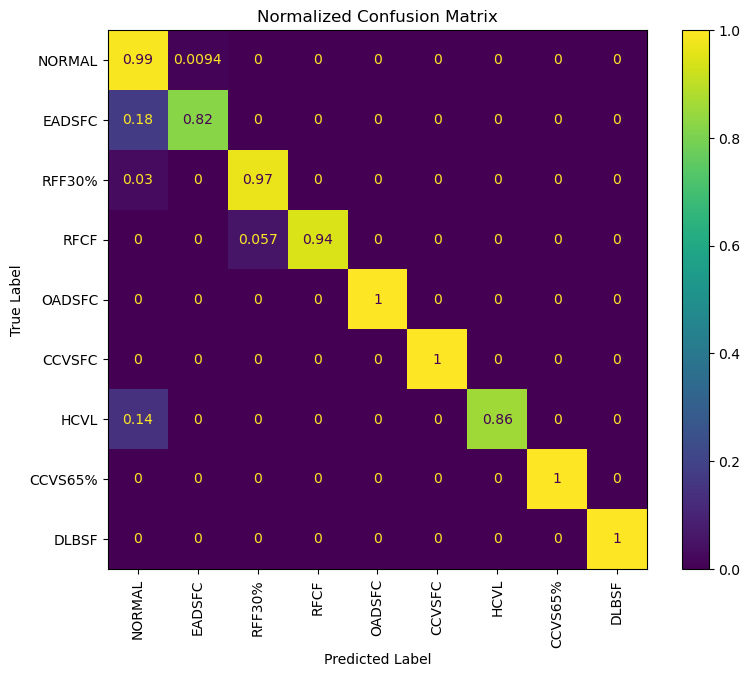


Confusion Matrix: 
 None

Accuracy : 
 96.95652173913044

Report :
                precision    recall  f1-score   support

         0.0       0.90      0.99      0.94       213
         1.0       0.95      0.82      0.88        51
         2.0       0.97      0.97      0.97       100
         3.0       1.00      0.94      0.97        53
         4.0       1.00      1.00      1.00        46
         5.0       1.00      1.00      1.00       205
         6.0       1.00      0.86      0.92        78
         7.0       1.00      1.00      1.00       115
         8.0       1.00      1.00      1.00        59

    accuracy                           0.97       920
   macro avg       0.98      0.95      0.97       920
weighted avg       0.97      0.97      0.97       920



In [27]:
#With residual feature
clf_r = train_using_gini(X_trainr, X_testr, y_trainr)
print("\nResults Using Gini Index(With residual feature):")
      
# Prediction using gini
y_predr = prediction(X_testr, clf_r)
cal_accuracy(y_testr, y_predr)
 
#pruning(X_train, y_train)
visualize_tree(clf_r, X_trainr)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


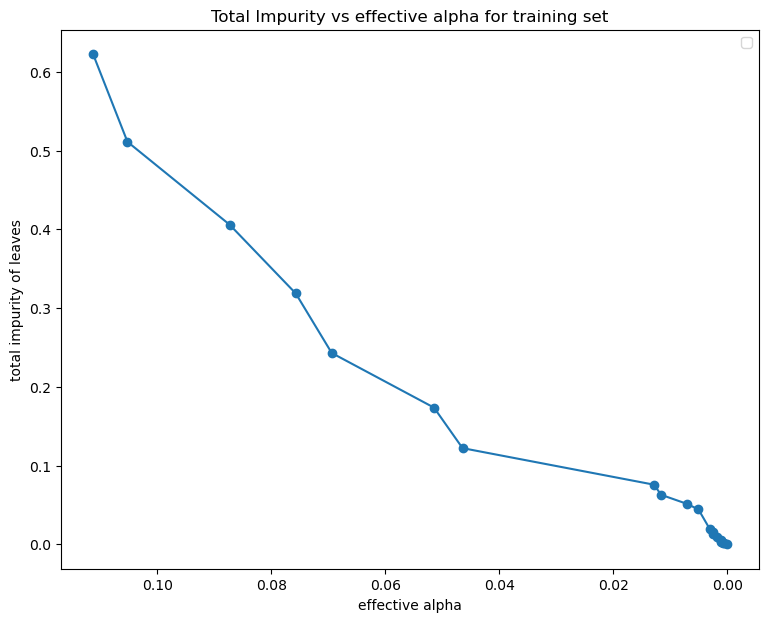

Number of nodes in the last tree is: 1 with ccp_alpha: 0.22057445370133433


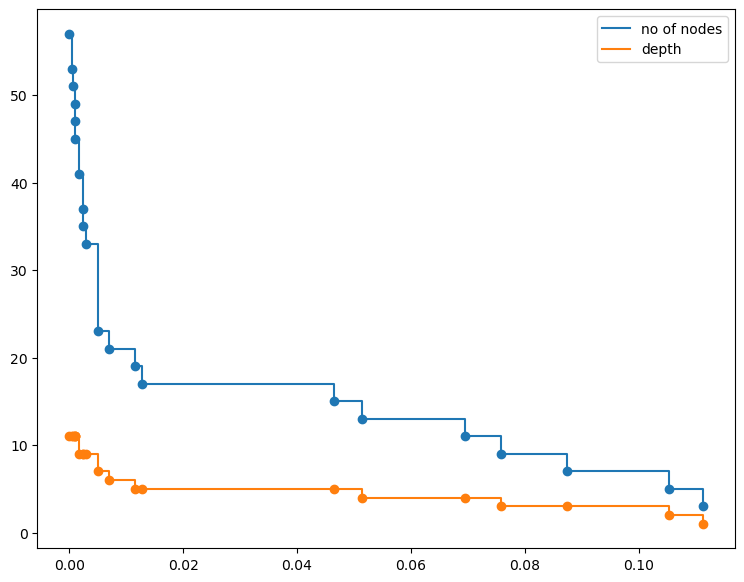

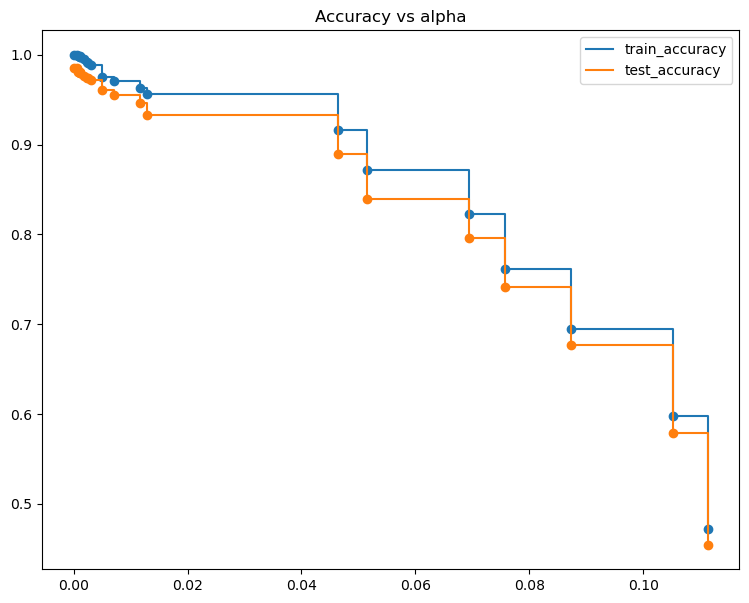

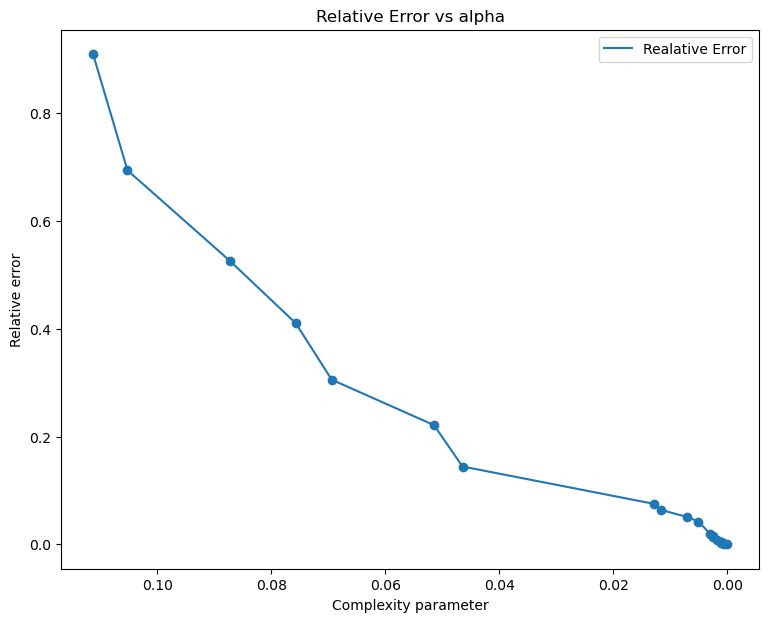

Train score 0.9951086956521739
Test score 0.9760869565217392


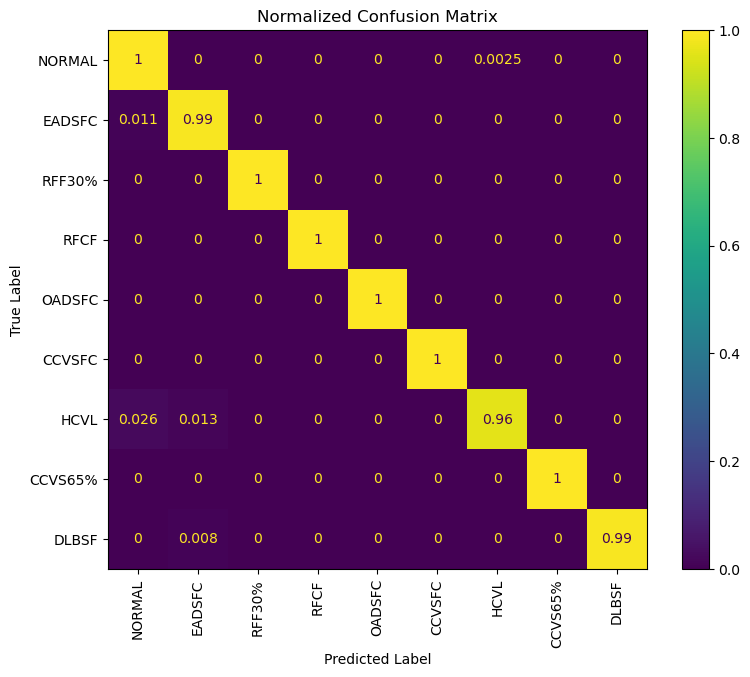

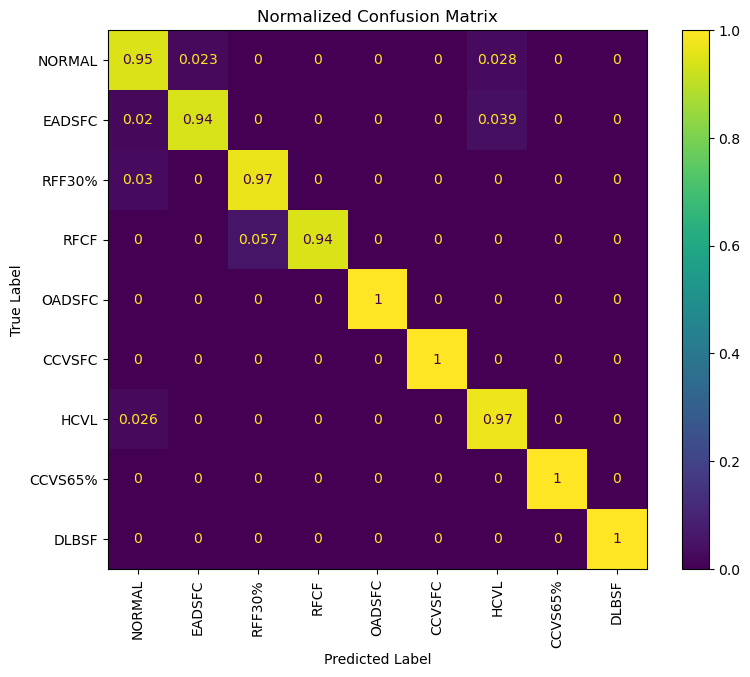


Confusion Matrix: 
 None

Accuracy : 
 97.60869565217392

Report :
                precision    recall  f1-score   support

         0.0       0.97      0.95      0.96       213
         1.0       0.91      0.94      0.92        51
         2.0       0.97      0.97      0.97       100
         3.0       1.00      0.94      0.97        53
         4.0       1.00      1.00      1.00        46
         5.0       1.00      1.00      1.00       205
         6.0       0.90      0.97      0.94        78
         7.0       1.00      1.00      1.00       115
         8.0       1.00      1.00      1.00        59

    accuracy                           0.98       920
   macro avg       0.97      0.98      0.97       920
weighted avg       0.98      0.98      0.98       920



In [28]:
ccp_alphas = pruning(X_trainr, y_trainr, X_testr, y_testr)

<AxesSubplot:xlabel='tree'>

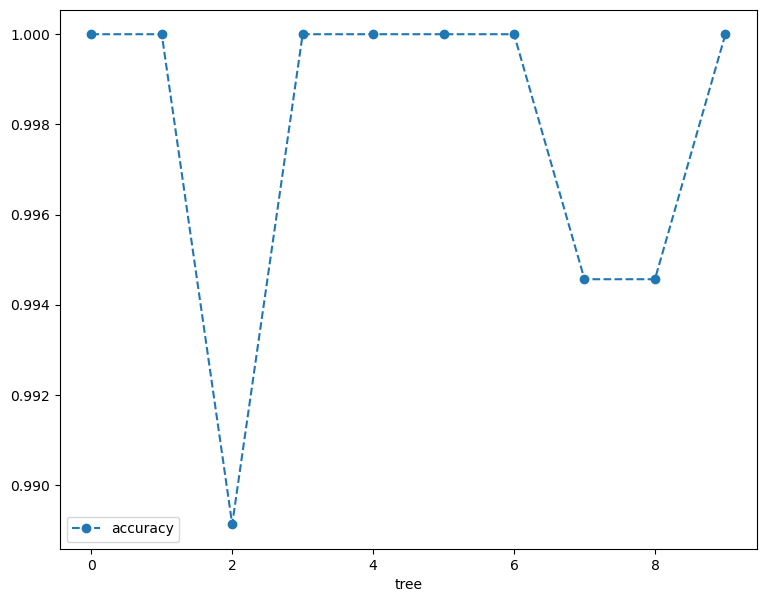

In [28]:
from sklearn.model_selection import cross_val_score
# 10- fold cross validation for given alpha value= 0.025

clf_ = tree.DecisionTreeClassifier(random_state=0,ccp_alpha=0.025)
scores = cross_val_score(clf_, X_train, y_train, cv=10)
df2 = pd.DataFrame(data={'tree':range(10), 'accuracy': scores})
df2.plot(x= 'tree', y ='accuracy',marker='o', linestyle='--')

<AxesSubplot:xlabel='alpha'>

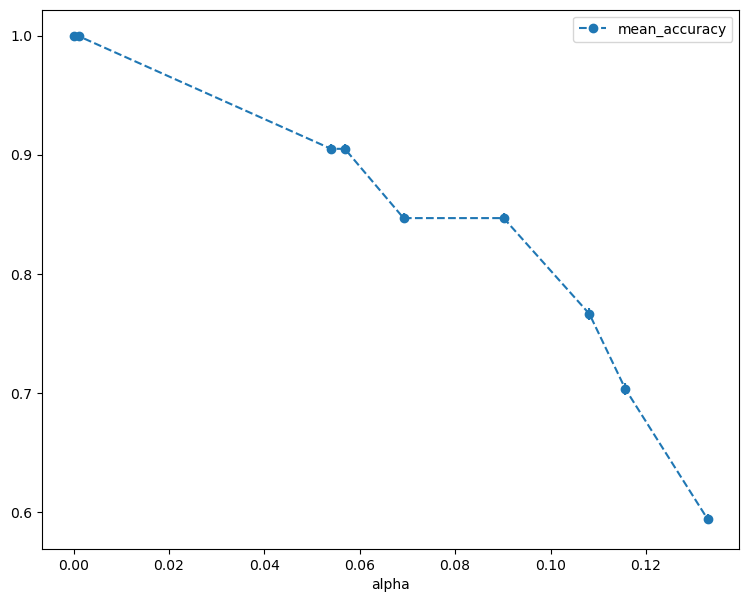

In [29]:


## create an array to store result of each fold during cross validation
alpha_loop_values =[]

## for each alpha value we will run 10-fold cross validation

for ccp_alpha in ccp_alphas:
    clf_ = tree.DecisionTreeClassifier(random_state=0,ccp_alpha=ccp_alpha)
    scores = cross_val_score(clf_, X_train, y_train, cv=10)
    alpha_loop_values.append([ccp_alpha, np.mean(scores), np.std(scores)])
    
alpha_results = pd.DataFrame(alpha_loop_values, columns=['alpha','mean_accuracy','std'])

alpha_results.plot(x='alpha', y= 'mean_accuracy', yerr = 'std', marker='o', linestyle='--')
    

In [30]:
alpha_results
ideal_alpha = alpha_results.loc[2]

In [31]:
alpha_results

,alpha,mean_accuracy,std
0,0.000000,0.999457,0.001630
1,0.001084,0.999457,0.001630
2,0.053982,0.904891,0.003646
3,0.056876,0.904891,0.003646
4,0.069192,0.846739,0.004067
5,0.090175,0.846739,0.004067
6,0.108151,0.766304,0.004861
7,0.115697,0.703261,0.004981
8,0.132943,0.594022,0.004245
